In [214]:
# Imports
import os

import numpy as np 
import pandas as pd 

# Visualization
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.colors import ListedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable

import cv2

README

# Drive on Mars

![Mars rover](https://panoptes-uploads.zooniverse.org/production/project_attached_image/17243d9d-1258-4aa7-80f0-6e7b20e957c6.png)

With this project we are attempting to improve the future of self driving vehicles on Mars.
Current autonomous vehicles driving algorithms are trained for streets and roads, very different from the conditions on Mars. 

Our model will predict which kind of terrains lies ahead of a rover: from soil, sand, bedrock or big rocks. This informs a rover navigation on the best route to take. We will build an image segmentation classifier, with a trained model available online.



# To work on this project:

## Clone this repo
`git clone  git@github.com:TigerManon/drive-on-mars.git`

## Download the data from Kaggle

[AI4MARS dataset](https://www.kaggle.com/datasets/yash92328/ai4mars-terrainaware-autonomous-driving-on-mars/data)


```
mv archive.zip <your-path-to-the-repo>/drive-on-mars/raw_data
cd <your-path-to-the-repo>/drive-on-mars/raw_data
unzip archive.zip
rm archive.zip


pip install -r requirements
```

# For our team

Use the following commands

`path-to-the-repo =  ~/code/TigerManon`

```
mv archive.zip ~/code/TigerManon/drive-on-mars/raw_data
cd ~/code/TigerManon/drive-on-mars/raw_data
unzip archive.zip
rm archive.zip

pip install -r requirements
```


## Defining paths

In [2]:
# Customize your path here
root_path = '../'

In [3]:
DATA_PATH = os.path.join(root_path, 'raw_data', 'ai4mars-dataset-merged-0.1', 'msl')
DATA_PATH

'../raw_data/ai4mars-dataset-merged-0.1/msl'

In [63]:
IMAGE_PATH = os.path.join(DATA_PATH, 'images', 'edr')
MASK_PATH_TRAIN = os.path.join(DATA_PATH, 'labels', 'train')
MASK_PATH_TESTS = os.path.join(DATA_PATH, 'labels', 'test')
TESTS_DIR = ['masked-gold-min1-100agree', 'masked-gold-min2-100agree', 'masked-gold-min3-100agree']

MASK_ROVER = os.path.join(DATA_PATH, 'images', 'mxy')
RANGE_30M = os.path.join(DATA_PATH, 'images', 'rng-30m')

In [259]:
def list_data_files():
    images = os.listdir(IMAGE_PATH)
    print(f"Found {len(images)} files in {IMAGE_PATH}")

    rover_masks = os.listdir(MASK_ROVER) 
    print(f"Found {len(rover_masks)} files in {MASK_ROVER}")

    range_masks = os.listdir(RANGE_30M) 
    print(f"Found {len(range_masks)} files in {RANGE_30M}")

    train_masks = os.listdir(MASK_PATH_TRAIN) 
    print(f"Found {len(train_masks)} files in {MASK_PATH_TRAIN}")

    print('-'*20)
    for test_dir in TESTS_DIR:
        test_dir_path = os.path.join(MASK_PATH_TESTS,test_dir)
        print(f"Found {len(os.listdir(test_dir_path))} files in {test_dir_path}")

list_data_files()

Found 18130 files in ../raw_data/ai4mars-dataset-merged-0.1/msl/images/edr
Found 18097 files in ../raw_data/ai4mars-dataset-merged-0.1/msl/images/mxy
Found 18096 files in ../raw_data/ai4mars-dataset-merged-0.1/msl/images/rng-30m
Found 16064 files in ../raw_data/ai4mars-dataset-merged-0.1/msl/labels/train
--------------------
Found 322 files in ../raw_data/ai4mars-dataset-merged-0.1/msl/labels/test/masked-gold-min1-100agree
Found 322 files in ../raw_data/ai4mars-dataset-merged-0.1/msl/labels/test/masked-gold-min2-100agree
Found 322 files in ../raw_data/ai4mars-dataset-merged-0.1/msl/labels/test/masked-gold-min3-100agree


In [6]:
color_channels = 1

### Opening an image

In [8]:
# Testing with first image
test = 3
imname = images[test].split('.')[0]
imname

'NLB_444289841EDR_F0260000NCAM00252M1'

In [9]:
image_file = os.path.join(IMAGE_PATH,images[test])
image_file

'../raw_data/ai4mars-dataset-merged-0.1/msl/images/edr/NLB_444289841EDR_F0260000NCAM00252M1.JPG'

In [13]:
img_raw = cv2.imread(imagze_file)
img = np.zeros((1024,1024))
img[:,:] = img_raw[:,:,0]
img

array([[74., 85., 89., ..., 83., 80., 88.],
       [27., 35., 36., ..., 34., 32., 37.],
       [26., 31., 30., ..., 31., 30., 32.],
       ...,
       [12., 15., 15., ...,  6.,  7.,  7.],
       [11., 14., 14., ...,  6.,  7.,  7.],
       [28., 31., 32., ..., 13., 13., 14.]])

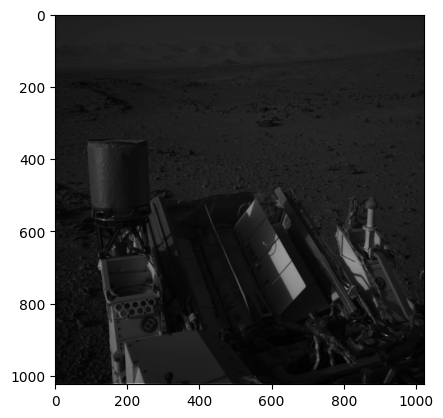

In [15]:
plt.imshow(img,cmap='gray')

### Opening rover and range masks

In [16]:
mask_file = os.path.join(MASK_ROVER, imname.replace("EDR","MXY") + ".png")
mask_file

'../raw_data/ai4mars-dataset-merged-0.1/msl/images/mxy/NLB_444289841MXY_F0260000NCAM00252M1.png'

In [17]:
mask_raw = np.array(cv2.imread(mask_file))
mask_raw
mask = np.zeros((1024,1024))
mask[:,:] = mask_raw[:,:,0]
mask = 1-mask

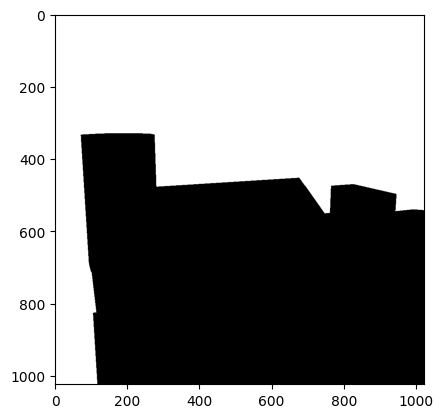

In [18]:
plt.imshow(mask,cmap='gray') 
plt.title;

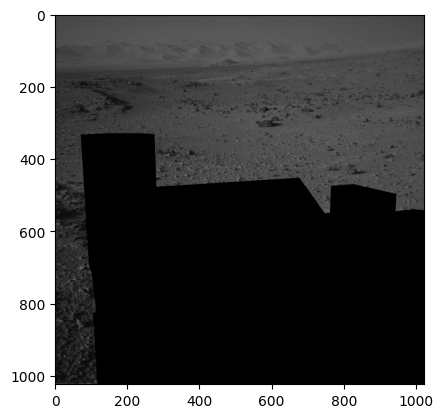

In [19]:
img_mask = img * mask
plt.imshow(img_mask,cmap='gray') ;

In [20]:
range_mask_file = os.path.join(RANGE_30M, imname.replace("EDR","RNG") + ".png")
range_mask_file


'../raw_data/ai4mars-dataset-merged-0.1/msl/images/rng-30m/NLB_444289841RNG_F0260000NCAM00252M1.png'

In [21]:
range_30m_raw = np.array(cv2.imread(range_mask_file))

range_30m = np.zeros((1024,1024))
range_30m[:,:] = range_30m_raw[:,:,0]
range_30m = 1 - range_30m
range_30m

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]])

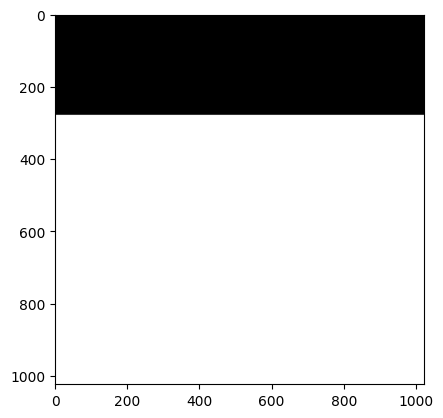

In [22]:
plt.imshow(range_30m,cmap='gray') ;

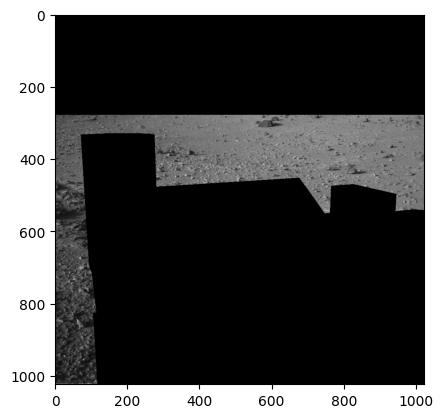

In [23]:
img_mask = img * mask * range_30m
plt.imshow(img_mask,cmap='gray') ;

## Load data methods

In [275]:
def create_df(path):
    """
    Loading images with corresponding masks and labels
    """
    names = []
    labels = []
    
    for filename in sorted(os.listdir(path)):
        imname = filename.split('.')[0]
        
        label = imname
        imname = imname.replace("_merged","")
        
        # checking raw image
        raw_image_file = os.path.join(IMAGE_PATH,imname + ".JPG")
        if not os.path.isfile(raw_image_file):
            print('No raw image found for', imname)
            continue
        
        # checking rover masks
        mask_rover_file = os.path.join(MASK_ROVER,imname.replace("EDR","MXY") + ".png")
        if not os.path.isfile(mask_rover_file):
            print('No rover mask found for', imname)
            continue
            
        # checking range masks
        range_mask_file = os.path.join(RANGE_30M, imname.replace("EDR","RNG") + ".png")
        if not os.path.isfile(range_mask_file):
            print('No range mask found for', imname)
            continue
            
        names.append(imname)
        labels.append(label)
        
    df = pd.DataFrame(
        {'name': names, 'label': labels}, 
        index = np.arange(0, len(names)))
    df['rov_mask'] = df.name.apply(lambda imname: imname.replace("EDR","MXY"))
    df['rang_mask'] = df.name.apply(lambda imname: imname.replace("EDR","RNG"))
    
    return df

In [276]:
df_train = create_df(MASK_PATH_TRAIN)
df_train

No range mask found for NLB_432655207EDR_F0160148NCAM00394M1


,name,label,rov_mask,rang_mask
0,NLA_397586934EDR_F0010008AUT_04096M1,NLA_397586934EDR_F0010008AUT_04096M1,NLA_397586934MXY_F0010008AUT_04096M1,NLA_397586934RNG_F0010008AUT_04096M1
1,NLA_397681339EDR_F0020000AUT_04096M1,NLA_397681339EDR_F0020000AUT_04096M1,NLA_397681339MXY_F0020000AUT_04096M1,NLA_397681339RNG_F0020000AUT_04096M1
2,NLA_397681372EDR_F0020000AUT_04096M1,NLA_397681372EDR_F0020000AUT_04096M1,NLA_397681372MXY_F0020000AUT_04096M1,NLA_397681372RNG_F0020000AUT_04096M1
3,NLA_397681398EDR_F0020000AUT_04096M1,NLA_397681398EDR_F0020000AUT_04096M1,NLA_397681398MXY_F0020000AUT_04096M1,NLA_397681398RNG_F0020000AUT_04096M1
4,NLA_397681429EDR_F0020000AUT_04096M1,NLA_397681429EDR_F0020000AUT_04096M1,NLA_397681429MXY_F0020000AUT_04096M1,NLA_397681429RNG_F0020000AUT_04096M1
...,...,...,...,...
16058,NRB_588896093EDR_F0721616NCAM00312M1,NRB_588896093EDR_F0721616NCAM00312M1,NRB_588896093MXY_F0721616NCAM00312M1,NRB_588896093RNG_F0721616NCAM00312M1
16059,NRB_589338714EDR_F0722272NCAM00260M1,NRB_589338714EDR_F0722272NCAM00260M1,NRB_589338714MXY_F0722272NCAM00260M1,NRB_589338714RNG_F0722272NCAM00260M1
16060,NRB_589344414EDR_F0722272NCAM00272M1,NRB_589344414EDR_F0722272NCAM00272M1,NRB_589344414MXY_F0722272NCAM00272M1,NRB_589344414RNG_F0722272NCAM00272M1
16061,NRB_605858122EDR_F0750000NCAM00288M1,NRB_605858122EDR_F0750000NCAM00288M1,NRB_605858122MXY_F0750000NCAM00288M1,NRB_605858122RNG_F0750000NCAM00288M1


In [277]:
df_test = create_df(MASK_PATH_TEST3)
df_test

,name,label,rov_mask,rang_mask
0,NLA_409036068EDR_F0051606NCAM00348M1,NLA_409036068EDR_F0051606NCAM00348M1_merged,NLA_409036068MXY_F0051606NCAM00348M1,NLA_409036068RNG_F0051606NCAM00348M1
1,NLA_409036116EDR_F0051606NCAM00348M1,NLA_409036116EDR_F0051606NCAM00348M1_merged,NLA_409036116MXY_F0051606NCAM00348M1,NLA_409036116RNG_F0051606NCAM00348M1
2,NLA_409036860EDR_F0051662NCAM00346M1,NLA_409036860EDR_F0051662NCAM00346M1_merged,NLA_409036860MXY_F0051662NCAM00346M1,NLA_409036860RNG_F0051662NCAM00346M1
3,NLA_409036993EDR_F0051662NCAM05703M1,NLA_409036993EDR_F0051662NCAM05703M1_merged,NLA_409036993MXY_F0051662NCAM05703M1,NLA_409036993RNG_F0051662NCAM05703M1
4,NLA_409037112EDR_F0051662NCAM05703M1,NLA_409037112EDR_F0051662NCAM05703M1_merged,NLA_409037112MXY_F0051662NCAM05703M1,NLA_409037112RNG_F0051662NCAM05703M1
...,...,...,...,...
317,NLB_613583373EDR_F0760568NCAM00280M1,NLB_613583373EDR_F0760568NCAM00280M1_merged,NLB_613583373MXY_F0760568NCAM00280M1,NLB_613583373RNG_F0760568NCAM00280M1
318,NLB_613583763EDR_F0760568NCAM00354M1,NLB_613583763EDR_F0760568NCAM00354M1_merged,NLB_613583763MXY_F0760568NCAM00354M1,NLB_613583763RNG_F0760568NCAM00354M1
319,NLB_613583877EDR_F0760568NCAM00354M1,NLB_613583877EDR_F0760568NCAM00354M1_merged,NLB_613583877MXY_F0760568NCAM00354M1,NLB_613583877RNG_F0760568NCAM00354M1
320,NLB_613584057EDR_F0760568NCAM00281M1,NLB_613584057EDR_F0760568NCAM00281M1_merged,NLB_613584057MXY_F0760568NCAM00281M1,NLB_613584057RNG_F0760568NCAM00281M1


In [279]:
labels_key = {
    0: 'soil',
    1: 'bedrock',
    2: 'sand',
    3: 'big rock',
    4: '(no label)',
}

custom_colors = {
    0: 'blue',
    1: 'yellow',
    2: 'purple',
    3: 'red',
    4: 'white',
}

cmap_labels = ListedColormap([custom_colors[i] for i in range(max(custom_colors)+1)])

In [317]:
def load_image_set(im_id, df):
    
    # Load raw image
    edr_file = f'{df.name.iloc[im_id]}.JPG'
    image_raw = cv2.imread(os.path.join(IMAGE_PATH,edr_file))
    image = image_raw[:,:,0]

    # Load labels
    label_file = f'{df.label.iloc[im_id]}.png'
    label_raw = cv2.imread(os.path.join(MASK_PATH_TRAIN,label_file))
    label = label_raw[:,:,0]
    
    # Changing scale for the 'No label' encoded as 255 
    label[label == 255] = 4
    
    # Load and combine both masks
    rov_mask_file = f'{df.rov_mask.iloc[im_id]}.png'
    rov_mask_raw = np.array(cv2.imread(os.path.join(MASK_ROVER,rov_mask_file)))
    rov_mask = np.zeros((1024,1024))
    rov_mask[:,:] = rov_mask_raw[:,:,0]
    
    rang_mask_file = f'{df.rang_mask.iloc[im_id]}.png'
    rang_mask_raw = np.array(cv2.imread(os.path.join(RANGE_30M,rang_mask_file)))
    rang_mask = np.zeros((1024,1024))
    rang_mask[:,:] = rang_mask_raw[:,:,0]
    
    # reversing mask to only keep the image out of the mask
    mask = (1-rov_mask) * (1-rang_mask)
    
    return image, label, mask

In [ ]:
X.shape[-1]

In [318]:
def load_images(df):
    
    X, y = [], []
    
    for i in df.index:
        image, label, mask = load_image_set(i, df)
        
        X.append(image * mask)
        y.append(label * mask)
        
    return np.array(X), np.array(y)

X,y = load_images(df_train.iloc[:200])

In [307]:
X.shape

(200, 1024, 1024)

In [316]:
def show_image(image, mask=None):
    
    n_sub = 1
    if mask is not None:
        n_sub=2
    fig, ax = plt.subplots(1, n_sub, figsize=(16,9))
    
    ax[0].axis('off')
    ax[0].imshow(image, cmap='gray')
    ax[0].set_title('Raw image')
    
    if n_sub==2:
        ax[1].axis('off')
        ax[1].imshow(image*mask, cmap='gray')
        ax[1].set_title('Masked')
        

In [352]:
# Example

image, label, mask = load_image_set(456, df_train)

In [351]:
for i in range(500):
    image, label, mask = load_image_set(i, df_train)
    if len(np.unique(label))>4:
        print(i)

351
365
456


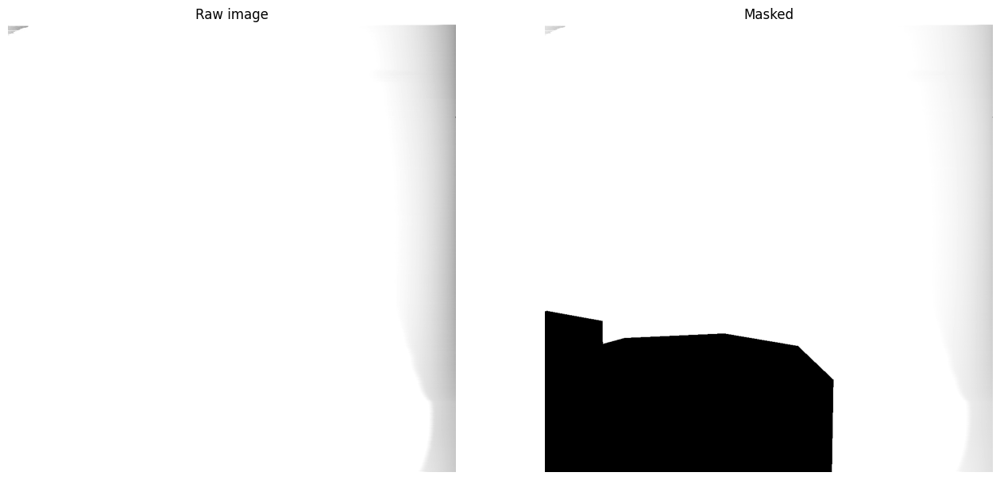

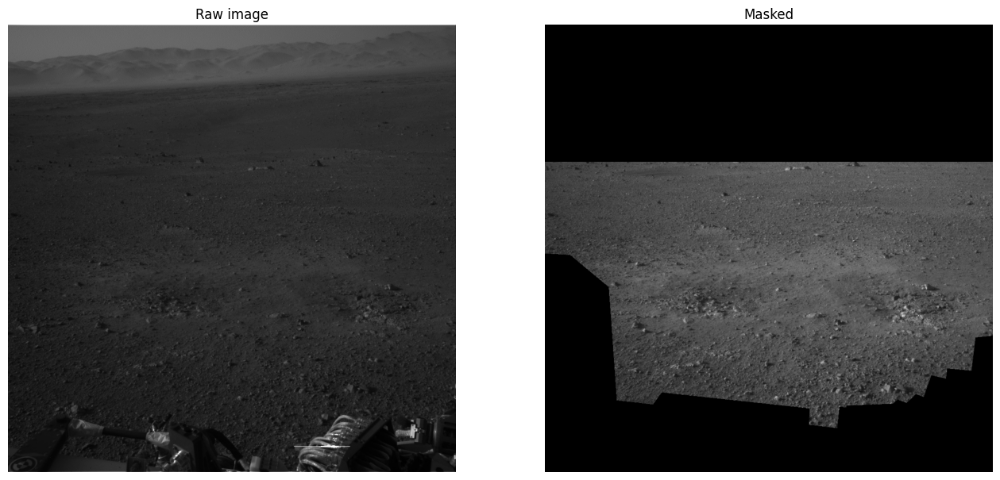

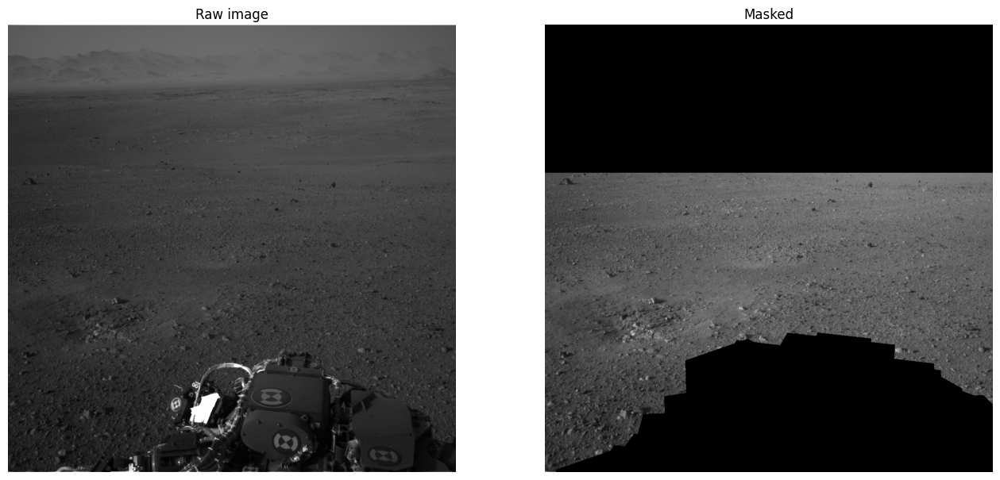

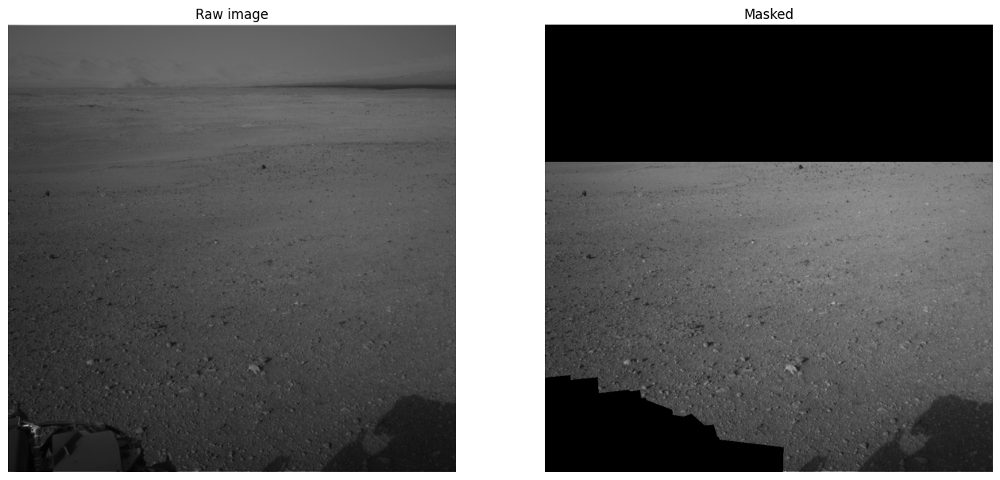

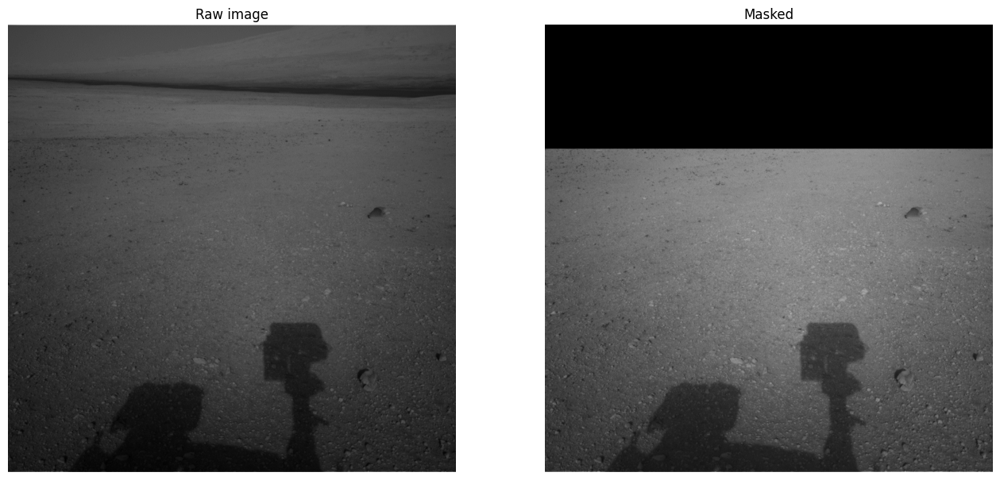

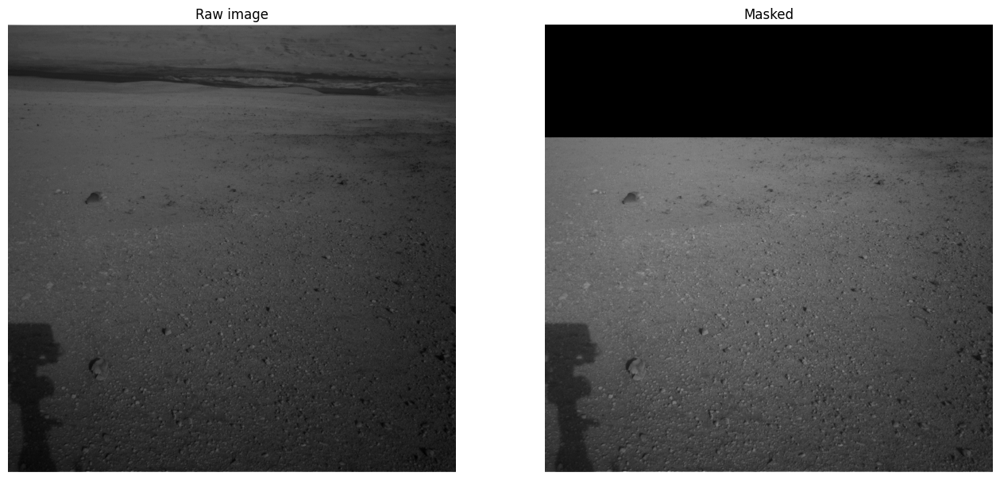

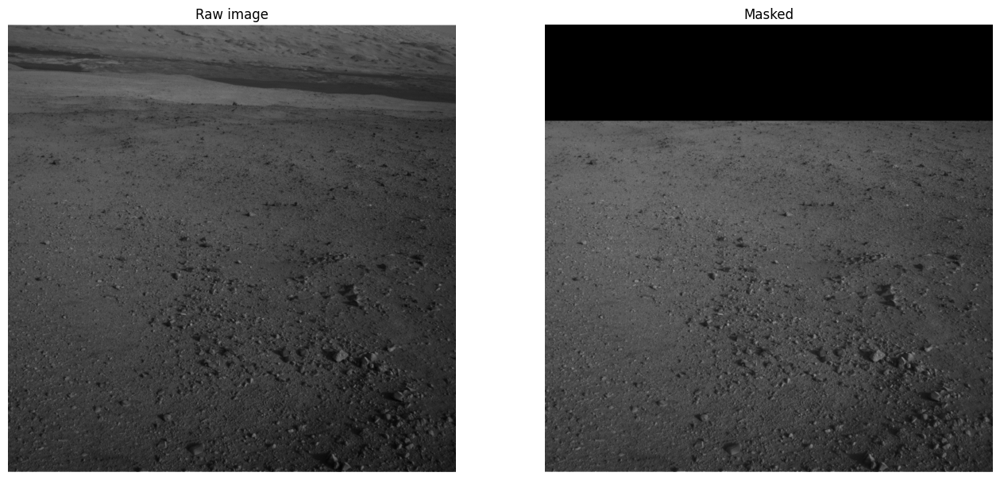

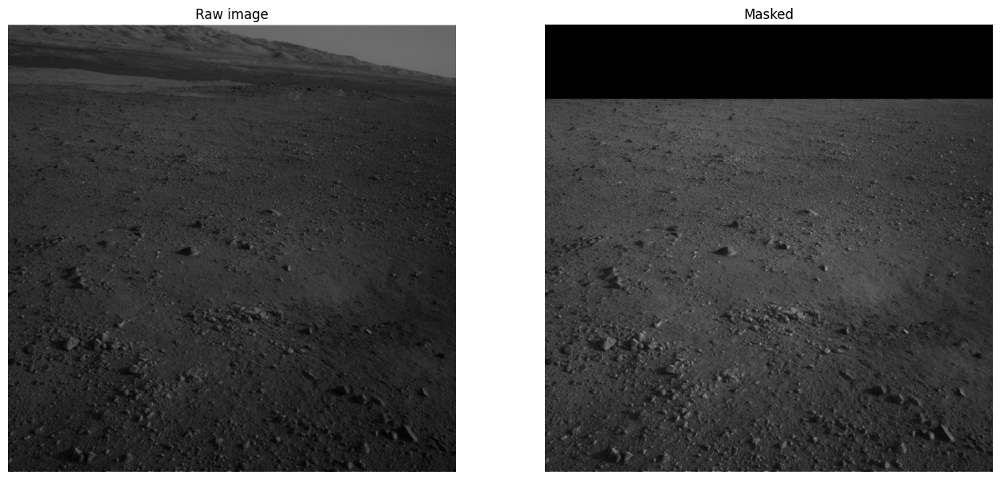

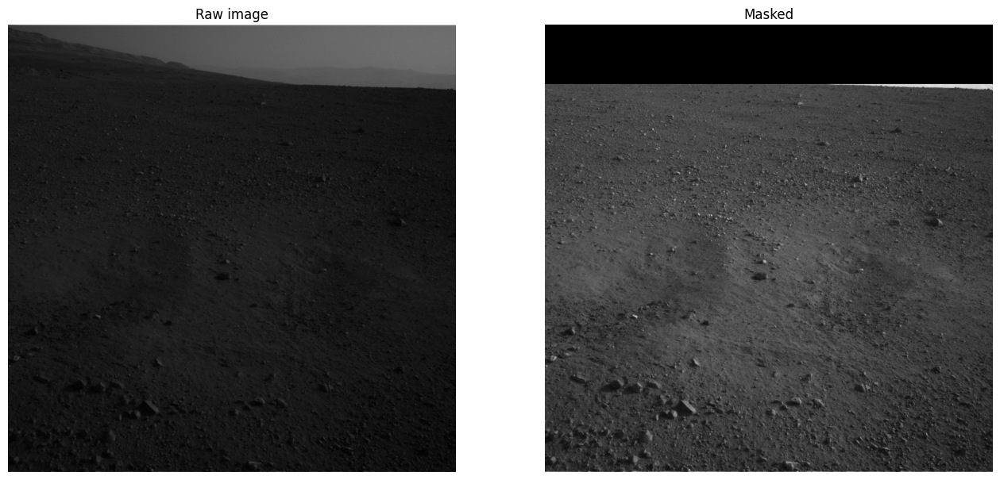

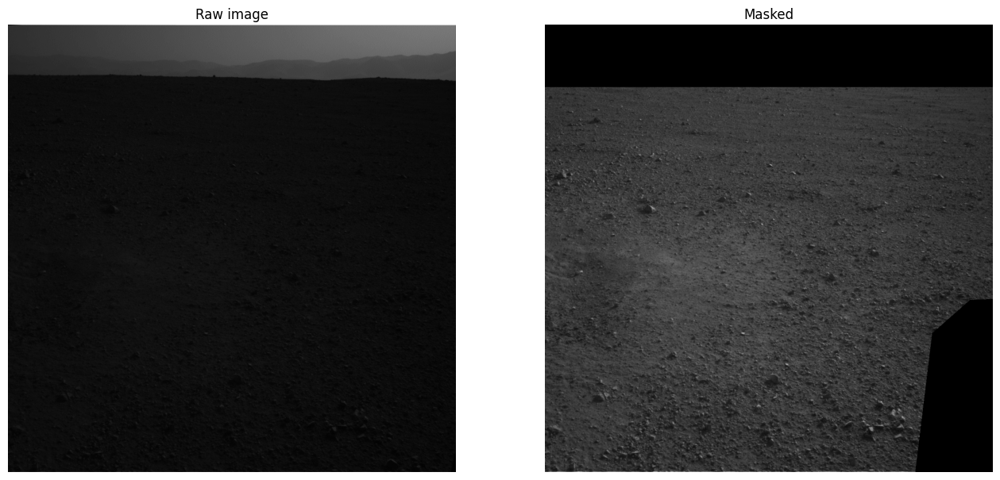

In [340]:
for i in range(10):
    image, label, mask = load_image_set(i, df_train)
    show_image(image, mask)

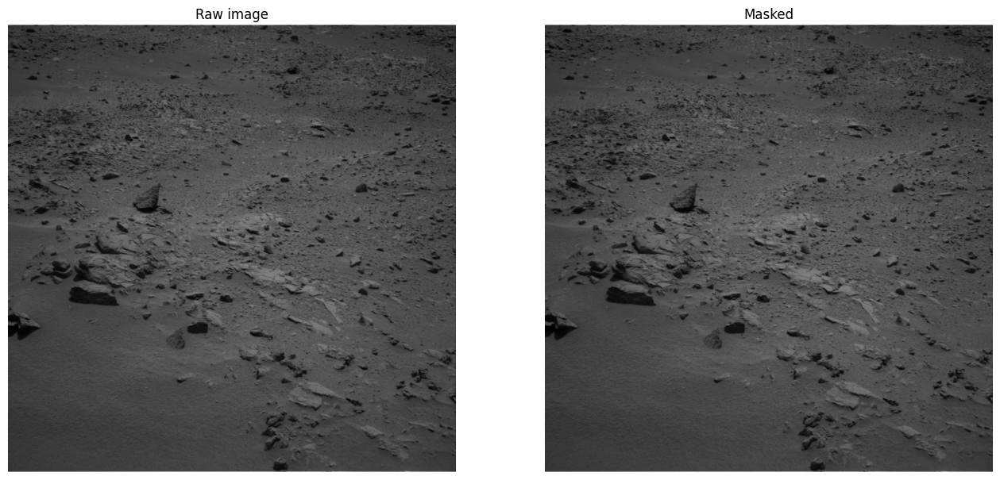

In [353]:
show_image(image, mask)

In [354]:
def decompose_label(label_img):
    
    label_0 = np.where(label_img == 0, 1, 0)
    label_1 = np.where(label_img == 1, 1, 0)
    label_2 = np.where(label_img == 2, 1, 0)
    label_3 = np.where(label_img == 3, 1, 0)
    label_4 = np.where(label_img == 4, 1, 0)
    
    return np.array([label_0, label_1, label_2, label_3, label_4])


def decompose_y(y):
    
#     label_0 = np.where(label_img == 0, 1, 0)
#     label_1 = np.where(label_img == 1, 1, 0)
#     label_2 = np.where(label_img == 2, 1, 0)
#     label_3 = np.where(label_img == 3, 1, 0)
#     label_4 = np.where(label_img == 4, 1, 0)
    
    return np.array()

In [355]:
decomp = decompose_label(label)
decomp.shape

(5, 1024, 1024)

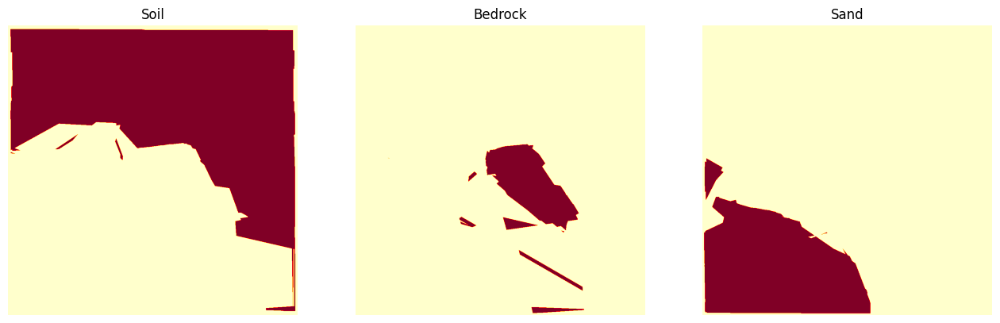

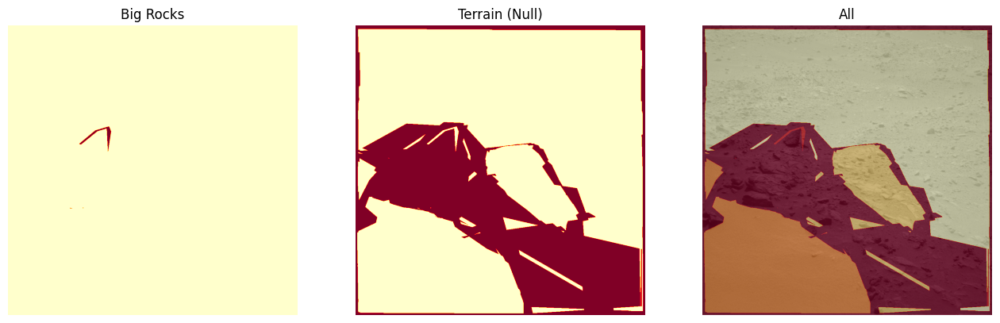

In [361]:
def show_labels_indv(label,image): 

    label_0, label_1, label_2, label_3, label_4 = decompose_label(label)
    
    fig, ax = plt.subplots(1, 3, figsize=(16,9))
    ax[0].axis('off')
    ax[0].imshow(label_0, cmap='YlOrRd')
    ax[0].set_title('Soil')
    ax[1].axis('off')
    ax[1].imshow(label_1, cmap='YlOrRd')
    ax[1].set_title('Bedrock')
    ax[2].axis('off')
    ax[2].imshow(label_2, cmap='YlOrRd')
    ax[2].set_title('Sand')

    fig, ax = plt.subplots(1, 3, figsize=(16,9))
    ax[0].axis('off')
    ax[0].imshow(label_3, cmap='YlOrRd')
    ax[0].set_title('Big Rocks')
    ax[1].axis('off')
    ax[1].imshow(label_4,cmap='YlOrRd')
    ax[1].set_title('Terrain (Null)')

    ax[2].axis('off')
    ax[2].imshow(image,cmap='gray')
    ax[2].imshow(label, alpha =0.6, cmap='YlOrRd')

    ax[2].set_title('All')
    
show_labels_indv(label,image)

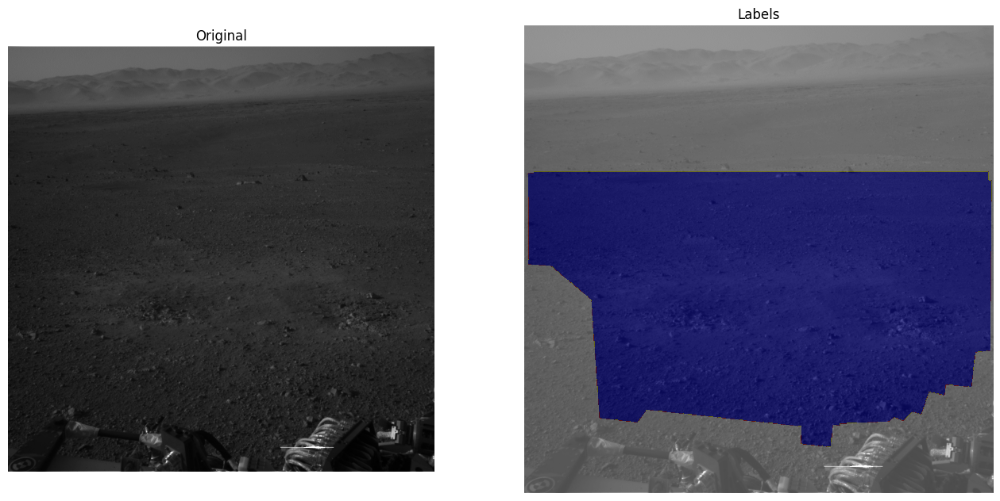

In [366]:
def show_labels_comp(image,label):
    fig, ax = plt.subplots(1, 2, figsize=(16, 9), gridspec_kw={'width_ratios': [2, 2.2]})

    ax[0].axis('off')
    ax[0].imshow(image, cmap='gray', aspect='equal')  # Set aspect='equal' for square
    ax[0].set_title('Original')

    ax[1].axis('off')
    ax[1].imshow(image, cmap='gray', aspect='equal')  # Set aspect='equal' for square
    img = ax[1].imshow(label, alpha=0.3, cmap=cmap_labels, aspect='equal')  # Set aspect='equal' for square
    ax[1].set_title('Labels')

#     divider = make_axes_locatable(ax[1])
#     cbar_ax = divider.append_axes("right", size="5%", pad=0.2)  # Adjust the size and pad

#     # Add colorbar to the right subplot
#     cbar = fig.colorbar(img, cax=cbar_ax, ticks=np.unique(label), orientation='vertical')

#     # Add tick labels to the colorbar
#     tick_labels = labels_key.values()
#     cbar.set_ticks(np.unique(label))
#     cbar.set_ticklabels(tick_labels)
#     cbar.ax.tick_params(axis='y', length=0)
#     cbar.ax.set_yticklabels(tick_labels, va='center')


    plt.show()
show_labels_comp(image,label)

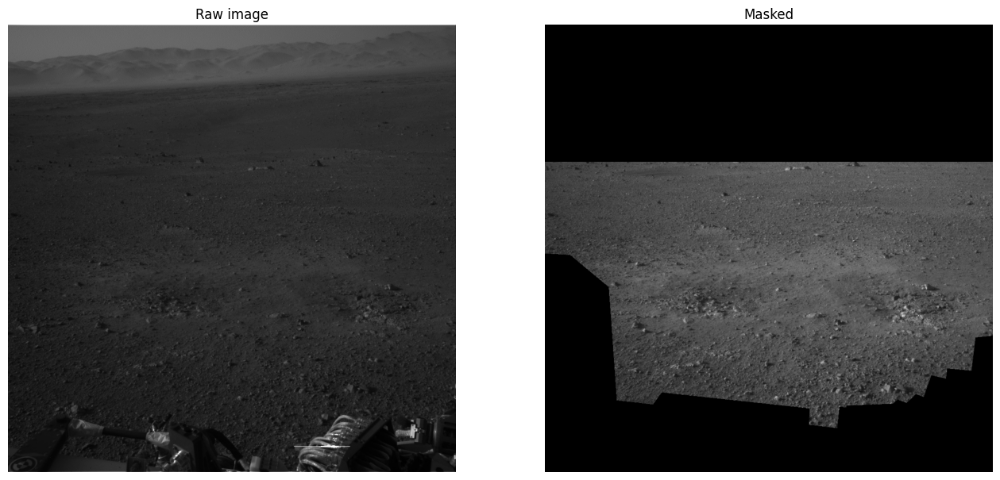

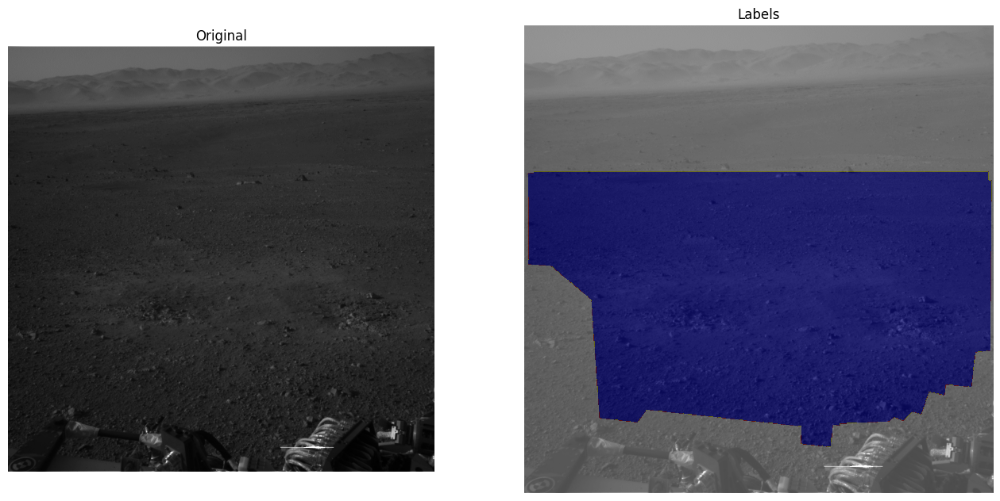

In [371]:
image, label, mask = load_image_set(1, df_train)
show_image(image, mask)

show_labels_comp(image,label)

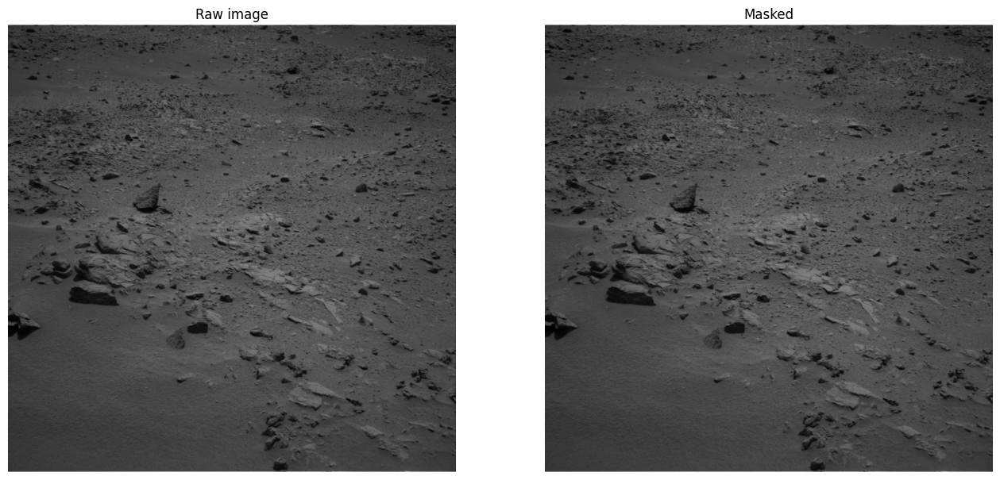

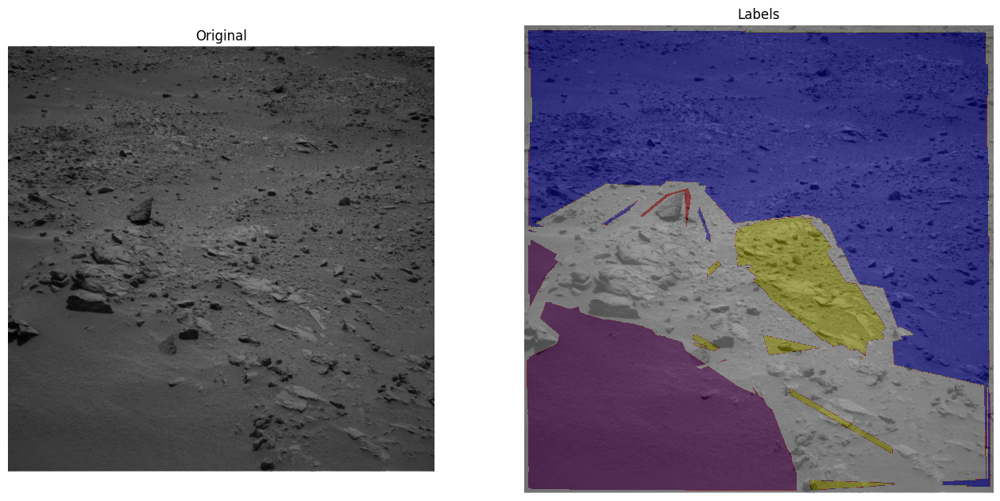

In [372]:
image, label, mask = load_image_set(456, df_train)
show_image(image, mask)

show_labels_comp(image,label)

## Checking the images in the test set

In [310]:
TESTS_DIR

['masked-gold-min1-100agree',
 'masked-gold-min2-100agree',
 'masked-gold-min3-100agree']

In [314]:
dir_ = os.path.join(MASK_PATH_TESTS,TESTS_DIR[0])
print(dir_)
df_test = create_df(dir_)
print(len(df_test))
df_test.head()

../raw_data/ai4mars-dataset-merged-0.1/msl/labels/test/masked-gold-min1-100agree
322


,name,label,rov_mask,rang_mask
0,NLA_409036068EDR_F0051606NCAM00348M1,NLA_409036068EDR_F0051606NCAM00348M1_merged,NLA_409036068MXY_F0051606NCAM00348M1,NLA_409036068RNG_F0051606NCAM00348M1
1,NLA_409036116EDR_F0051606NCAM00348M1,NLA_409036116EDR_F0051606NCAM00348M1_merged,NLA_409036116MXY_F0051606NCAM00348M1,NLA_409036116RNG_F0051606NCAM00348M1
2,NLA_409036860EDR_F0051662NCAM00346M1,NLA_409036860EDR_F0051662NCAM00346M1_merged,NLA_409036860MXY_F0051662NCAM00346M1,NLA_409036860RNG_F0051662NCAM00346M1
3,NLA_409036993EDR_F0051662NCAM05703M1,NLA_409036993EDR_F0051662NCAM05703M1_merged,NLA_409036993MXY_F0051662NCAM05703M1,NLA_409036993RNG_F0051662NCAM05703M1
4,NLA_409037112EDR_F0051662NCAM05703M1,NLA_409037112EDR_F0051662NCAM05703M1_merged,NLA_409037112MXY_F0051662NCAM05703M1,NLA_409037112RNG_F0051662NCAM05703M1


In [315]:
dir_ = os.path.join(MASK_PATH_TESTS,TESTS_DIR[1])
print(dir_)
df_test = create_df(dir_)
print(len(df_test))
df_test.head()

../raw_data/ai4mars-dataset-merged-0.1/msl/labels/test/masked-gold-min2-100agree
322


,name,label,rov_mask,rang_mask
0,NLA_409036068EDR_F0051606NCAM00348M1,NLA_409036068EDR_F0051606NCAM00348M1_merged,NLA_409036068MXY_F0051606NCAM00348M1,NLA_409036068RNG_F0051606NCAM00348M1
1,NLA_409036116EDR_F0051606NCAM00348M1,NLA_409036116EDR_F0051606NCAM00348M1_merged,NLA_409036116MXY_F0051606NCAM00348M1,NLA_409036116RNG_F0051606NCAM00348M1
2,NLA_409036860EDR_F0051662NCAM00346M1,NLA_409036860EDR_F0051662NCAM00346M1_merged,NLA_409036860MXY_F0051662NCAM00346M1,NLA_409036860RNG_F0051662NCAM00346M1
3,NLA_409036993EDR_F0051662NCAM05703M1,NLA_409036993EDR_F0051662NCAM05703M1_merged,NLA_409036993MXY_F0051662NCAM05703M1,NLA_409036993RNG_F0051662NCAM05703M1
4,NLA_409037112EDR_F0051662NCAM05703M1,NLA_409037112EDR_F0051662NCAM05703M1_merged,NLA_409037112MXY_F0051662NCAM05703M1,NLA_409037112RNG_F0051662NCAM05703M1


# Data augmentation

In [ ]:
import albumentations as A

# Use scripts

In [38]:
import os

import numpy as np
import pandas as pd

import cv2

# Customize your path here
root_path = '../'

DATA_PATH = os.path.join(root_path, 'raw_data', 'ai4mars-dataset-merged-0.1', 'msl')

IMAGE_PATH = os.path.join(DATA_PATH, 'images', 'edr')
MASK_PATH_TRAIN = os.path.join(DATA_PATH, 'labels', 'train')
MASK_PATH_TESTS = os.path.join(DATA_PATH, 'labels', 'test')
TESTS_DIR = ['masked-gold-min1-100agree', 'masked-gold-min2-100agree', 'masked-gold-min3-100agree']

MASK_ROVER = os.path.join(DATA_PATH, 'images', 'mxy')
RANGE_30M = os.path.join(DATA_PATH, 'images', 'rng-30m')



def create_df(path):
    """
    Generate dataframe based on all labeled images in a directory
    such as train labels or test labels.
    Input: path
    Output: dataframe with columns
        name of raw image
        name of the labeled image
        name of rover mask image
        name of range 30m mask image
    """
    names = []
    labels = []

    for filename in sorted(os.listdir(path)):
        imname = filename.split('.')[0]

        label = imname
        imname = imname.replace("_merged","")

        # checking raw image
        raw_image_file = os.path.join(IMAGE_PATH,imname + ".JPG")
        if not os.path.isfile(raw_image_file):
            print('No raw image found for', imname)
            continue

        # checking rover masks
        mask_rover_file = os.path.join(MASK_ROVER,imname.replace("EDR","MXY") + ".png")
        if not os.path.isfile(mask_rover_file):
            print('No rover mask found for', imname)
            continue

        # checking range masks
        range_mask_file = os.path.join(RANGE_30M, imname.replace("EDR","RNG") + ".png")
        if not os.path.isfile(range_mask_file):
            print('No range mask found for', imname)
            continue

        names.append(imname)
        labels.append(label)

    df = pd.DataFrame(
        {'name': names, 'label': labels},
        index = np.arange(0, len(names)))
    df['rov_mask'] = df.name.apply(lambda imname: imname.replace("EDR","MXY"))
    df['rang_mask'] = df.name.apply(lambda imname: imname.replace("EDR","RNG"))

    return df


def load_image_set(im_id, df):
    """
    Returns list of 2D arrays for each image as part of a set
    Input:  index of the image dataset dataframe
            the dataframe for the image dataset (train or test)
    Output:
            raw image
            labeled image

    """

    # Load raw image
    edr_file = f'{df.name.iloc[im_id]}.JPG'
    image_raw = cv2.imread(os.path.join(IMAGE_PATH,edr_file))
    image = image_raw[:,:,0]

    # Load labels
    label_file = f'{df.label.iloc[im_id]}.png'
    label_raw = cv2.imread(os.path.join(MASK_PATH_TRAIN,label_file))
    label = label_raw[:,:,0]

    # Changing scale for the 'No label' encoded as 255
    label[label == 255] = 4

    # Load and combine both masks
    rov_mask_file = f'{df.rov_mask.iloc[im_id]}.png'
    rov_mask_raw = np.array(cv2.imread(os.path.join(MASK_ROVER,rov_mask_file)))
    rov_mask = np.zeros((1024,1024))
    rov_mask[:,:] = rov_mask_raw[:,:,0]

    rang_mask_file = f'{df.rang_mask.iloc[im_id]}.png'
    rang_mask_raw = np.array(cv2.imread(os.path.join(RANGE_30M,rang_mask_file)))
    rang_mask = np.zeros((1024,1024))
    rang_mask[:,:] = rang_mask_raw[:,:,0]

    # reversing mask to only keep the image out of the mask
    mask = (1-rov_mask) * (1-rang_mask)

    return [image, label, mask]



def decompose_label(label_img):

    label_0 = np.where(label_img == 0, 1, 0)
    label_1 = np.where(label_img == 1, 1, 0)
    label_2 = np.where(label_img == 2, 1, 0)
    label_3 = np.where(label_img == 3, 1, 0)
    label_4 = np.where(label_img == 4, 1, 0)

    return np.stack([label_0, label_1, label_2, label_3, label_4], axis=-1)


def load_images(df):
    """
    Aggregates images and labels with masks applied
    Input: Dataframe of train or test sets
    Output: Array of
        masked images from raws
        masked labels
    """
    X, y = [], []
    for i in df.index:
        [image, label, mask] = load_image_set(i, df)

        X.append(image * mask)
        y.append(label * mask)

    X = np.array(X)
    y = np.array(y)
    y_decomp = decompose_label(y)
    
    return X, y_decomp

In [39]:
small_dataset = 100

df = create_df(MASK_PATH_TRAIN)

df = df.iloc[:100]

X, y = load_images(df)

No range mask found for NLB_432655207EDR_F0160148NCAM00394M1


In [40]:
X.shape, y.shape

((100, 1024, 1024), (100, 1024, 1024, 5))

In [1]:
from ../code/data import load_images

SyntaxError: invalid syntax (527688646.py, line 1)